In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the datasets
data = pd.read_csv('API_SP.POP.TOTL_DS2_en_csv_v2_23.csv', skiprows=4)
metadata_country = pd.read_csv('Metadata_Country_API_SP.POP.TOTL_DS2_en_csv_v2_23.csv')
metadata_indicator = pd.read_csv('Metadata_Indicator_API_SP.POP.TOTL_DS2_en_csv_v2_23.csv')



# Merge the main data with country metadata
merged_data = pd.merge(data, metadata_country, on='Country Code', how='left')

# Display the first few rows of the merged dataset
print(merged_data.head())

# Filter the data for the latest year available
latest_year = '2023'
population_data = merged_data[['Country Name', latest_year]].dropna()

# Convert the population data to numeric, handling any non-numeric values
population_data[latest_year] = pd.to_numeric(population_data[latest_year], errors='coerce')

# Sort the data by population for better visualization
population_data = population_data.sort_values(by=latest_year, ascending=False).head(20)




                  Country Name Country Code     Indicator Name Indicator Code  \
0                        Aruba          ABW  Population, total    SP.POP.TOTL   
1  Africa Eastern and Southern          AFE  Population, total    SP.POP.TOTL   
2                  Afghanistan          AFG  Population, total    SP.POP.TOTL   
3   Africa Western and Central          AFW  Population, total    SP.POP.TOTL   
4                       Angola          AGO  Population, total    SP.POP.TOTL   

          1960         1961         1962         1963         1964  \
0      54608.0      55811.0      56682.0      57475.0      58178.0   
1  130692579.0  134169237.0  137835590.0  141630546.0  145605995.0   
2    8622466.0    8790140.0    8969047.0    9157465.0    9355514.0   
3   97256290.0   99314028.0  101445032.0  103667517.0  105959979.0   
4    5357195.0    5441333.0    5521400.0    5599827.0    5673199.0   

          1965  ...         2020         2021         2022         2023  \
0      58782.0  .

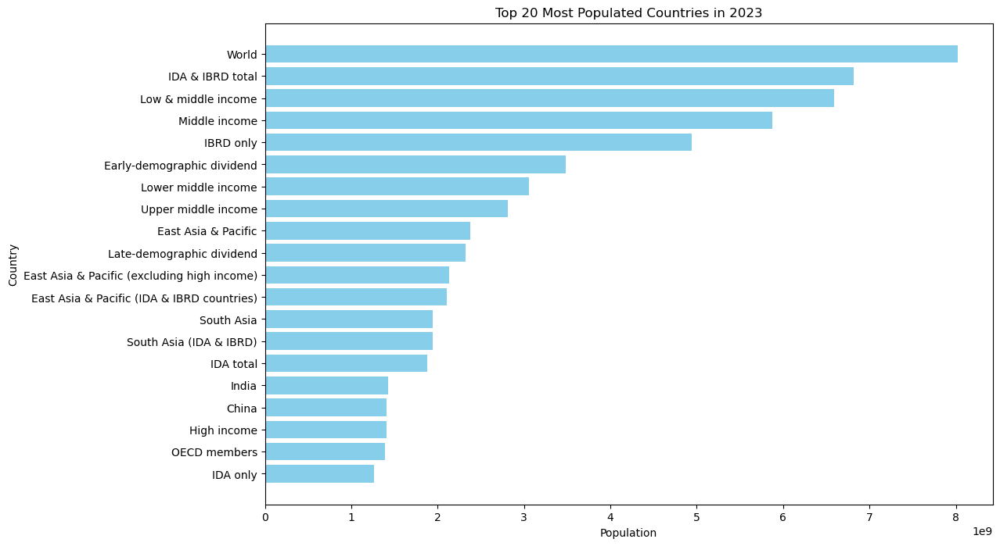

In [5]:
# Create the bar chart
plt.figure(figsize=(12, 8))
plt.barh(population_data['Country Name'], population_data[latest_year], color='skyblue')
plt.xlabel('Population')
plt.ylabel('Country')
plt.title(f'Top 20 Most Populated Countries in {latest_year}')
plt.gca().invert_yaxis()
plt.show()

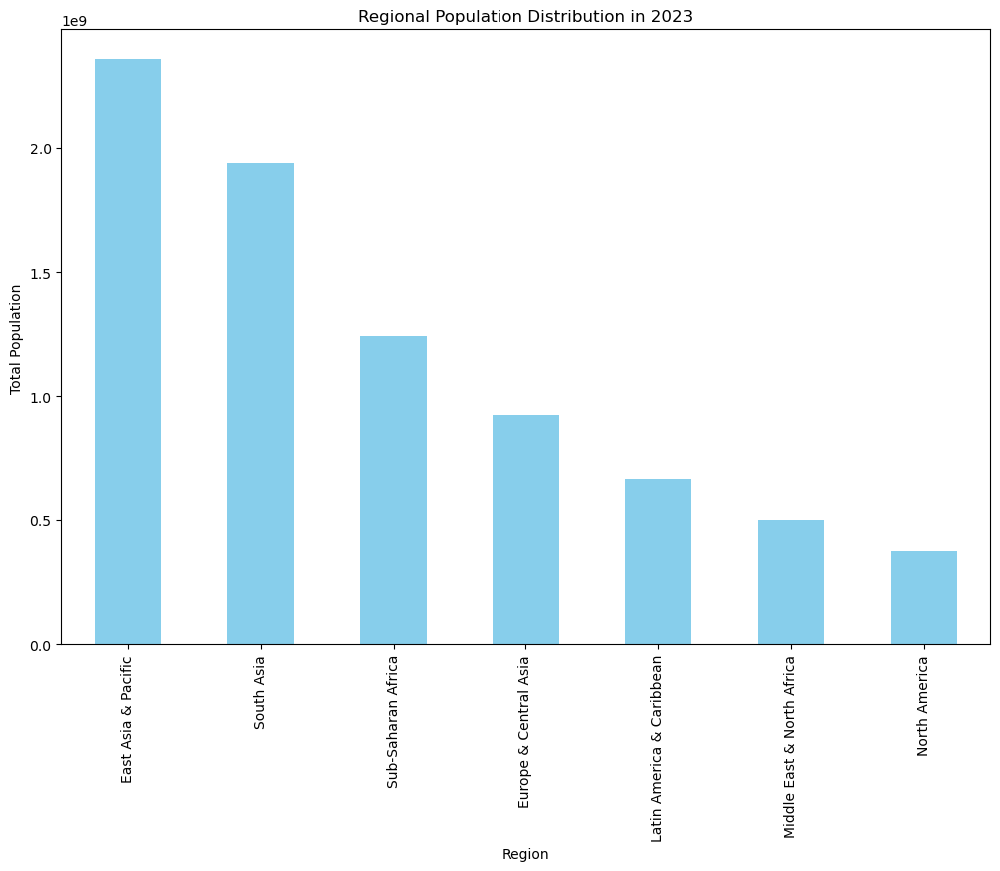

In [6]:
# Regional Population Analysis
region_population = merged_data.groupby('Region')[latest_year].sum().sort_values(ascending=False)

# Plot the regional population distribution
plt.figure(figsize=(12, 8))
region_population.plot(kind='bar', color='skyblue')
plt.xlabel('Region')
plt.ylabel('Total Population')
plt.title(f'Regional Population Distribution in {latest_year}')
plt.show()


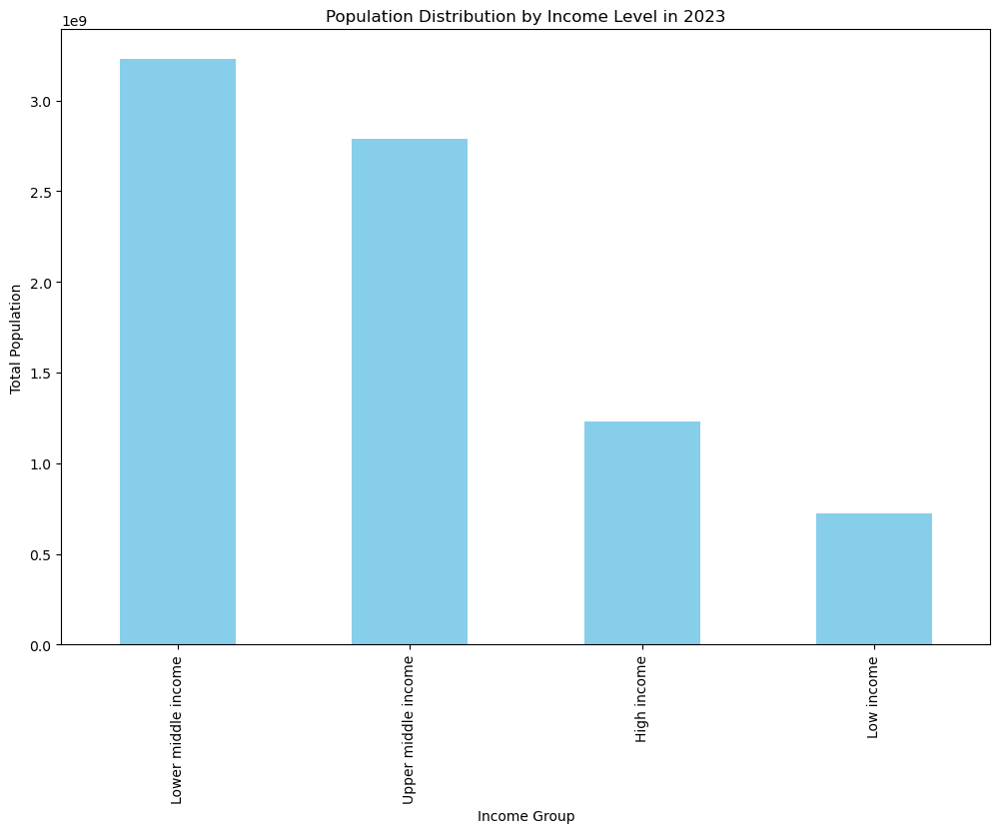

In [7]:
# Income Level Population Analysis
income_population = merged_data.groupby('IncomeGroup')[latest_year].sum().sort_values(ascending=False)

# Plot the income level population distribution
plt.figure(figsize=(12, 8))
income_population.plot(kind='bar', color='skyblue')
plt.xlabel('Income Group')
plt.ylabel('Total Population')
plt.title(f'Population Distribution by Income Level in {latest_year}')
plt.show()


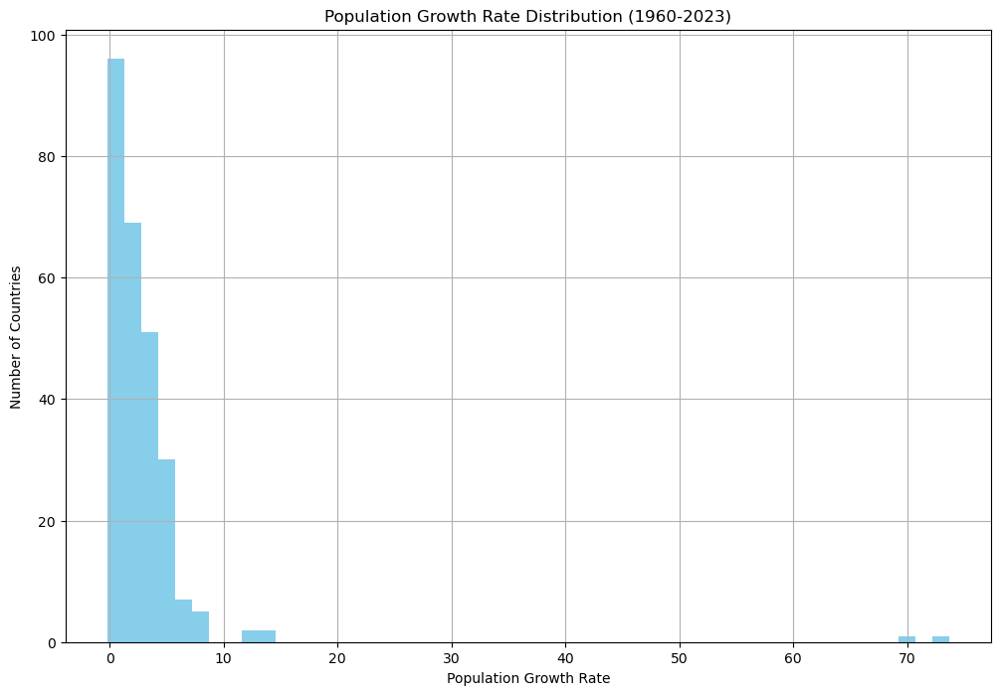

In [8]:
# Population Growth Analysis
merged_data['Population Growth Rate'] = merged_data[latest_year] / merged_data['1960'] - 1

# Plot the population growth rates
plt.figure(figsize=(12, 8))
merged_data['Population Growth Rate'].hist(bins=50, color='skyblue')
plt.xlabel('Population Growth Rate')
plt.ylabel('Number of Countries')
plt.title('Population Growth Rate Distribution (1960-2023)')
plt.show()


In [9]:
# Top and Bottom Countries by Population Growth
top_growth_countries = merged_data.sort_values(by='Population Growth Rate', ascending=False).head(10)
bottom_growth_countries = merged_data.sort_values(by='Population Growth Rate', ascending=True).head(10)

print("Top 10 Countries by Population Growth Rate:")
print(top_growth_countries[['Country Name', 'Population Growth Rate']])

print("\nBottom 10 Countries by Population Growth Rate:")
print(bottom_growth_countries[['Country Name', 'Population Growth Rate']])


Top 10 Countries by Population Growth Rate:
                  Country Name  Population Growth Rate
200                      Qatar               73.656892
8         United Arab Emirates               70.326960
225  Sint Maarten (Dutch part)               14.556689
127                     Kuwait               13.112300
118                     Jordan               12.370174
56                    Djibouti               12.223819
22                     Bahrain                8.244507
205               Saudi Arabia                7.869635
182                       Oman                7.655965
6                      Andorra                7.481203

Bottom 10 Countries by Population Growth Rate:
               Country Name  Population Growth Rate
21                 Bulgaria               -0.182654
125     St. Kitts and Nevis               -0.157166
248                 Ukraine               -0.134852
145                  Latvia               -0.112792
99                  Croatia               -

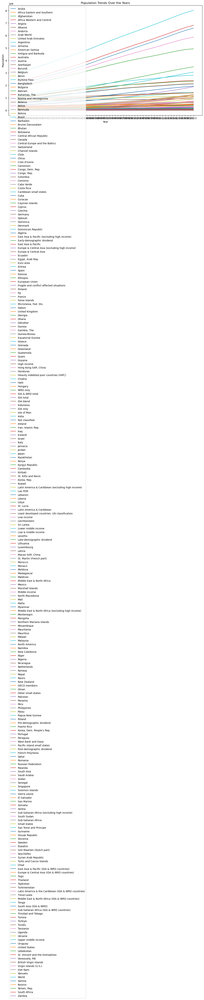

In [10]:


# Transpose the data for plotting
transposed_data = merged_data.set_index('Country Name').T

# Filter out non-year columns
years = [str(year) for year in range(1960, 2024)]
population_data = transposed_data.loc[years]

# Convert columns to numeric
population_data = population_data.apply(pd.to_numeric, errors='coerce')

# Plotting population trends for a subset of countries for clarity
countries_to_plot = population_data.columns[:-1]  # Adjust the number of countries to plot

plt.figure(figsize=(14, 8))

for country in countries_to_plot:
    plt.plot(population_data.index, population_data[country], label=country)

plt.xlabel('Year')
plt.ylabel('Population')
plt.title('Population Trends Over the Years')
plt.legend()
plt.show()


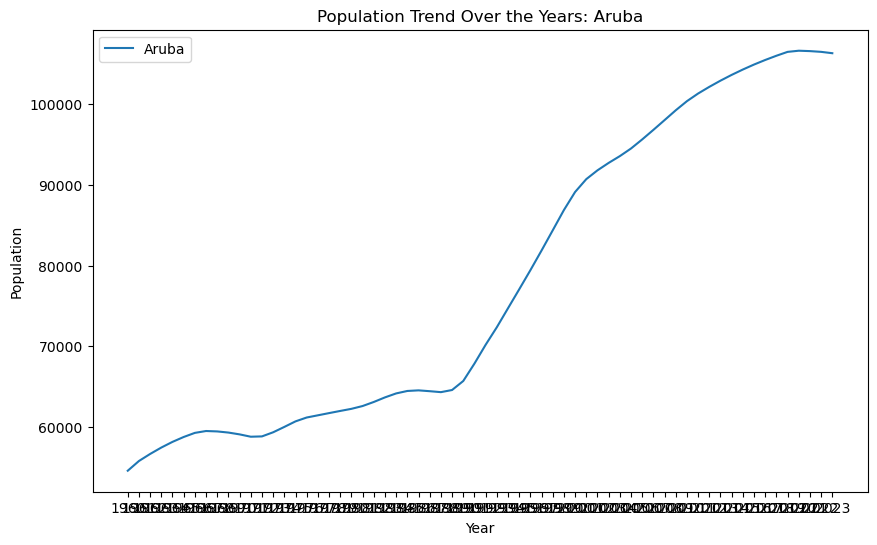

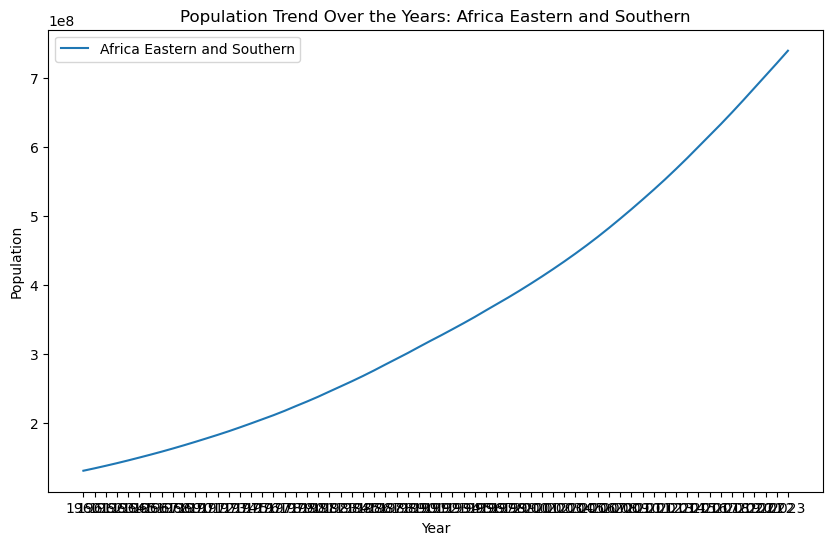

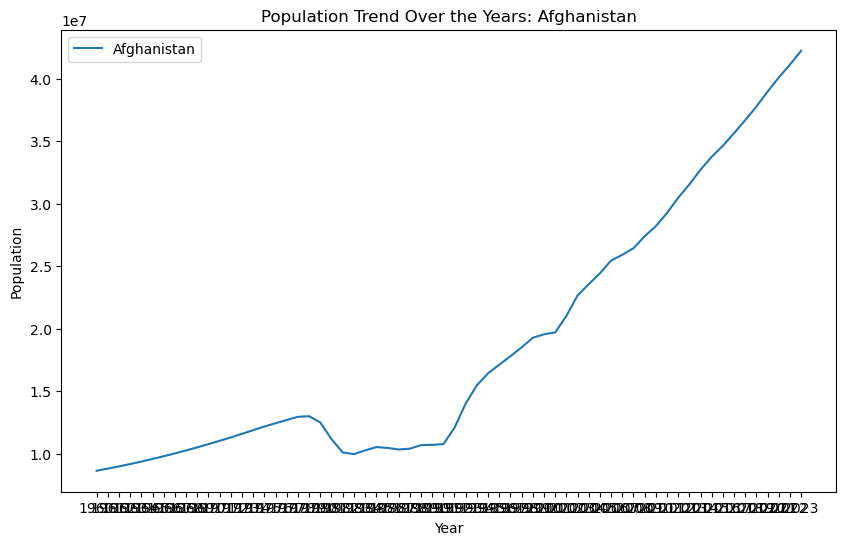

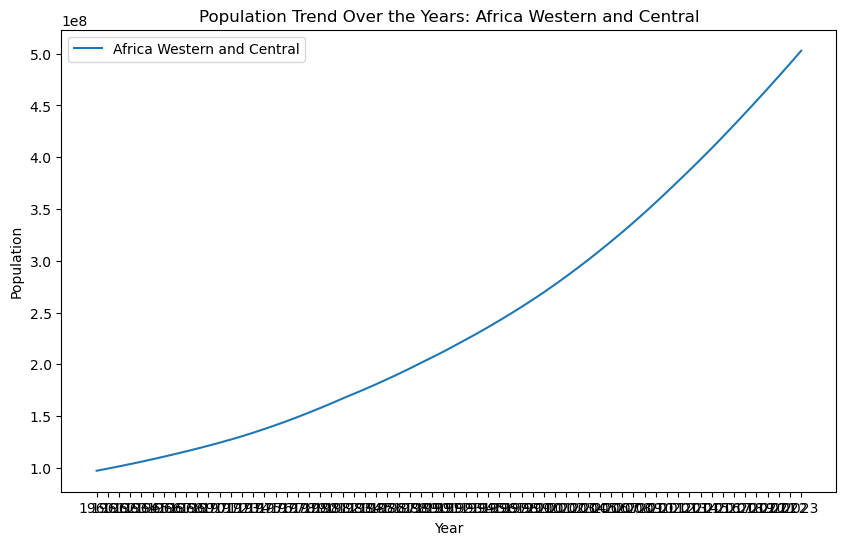

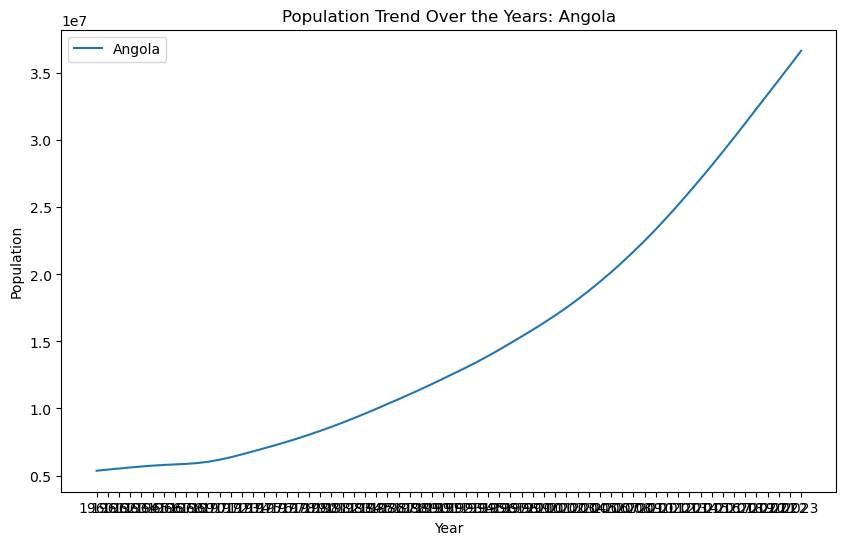

...

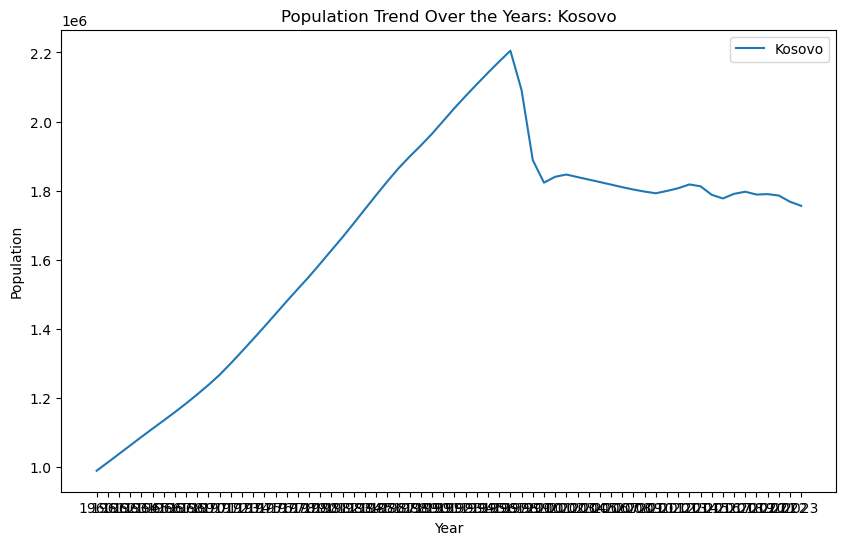

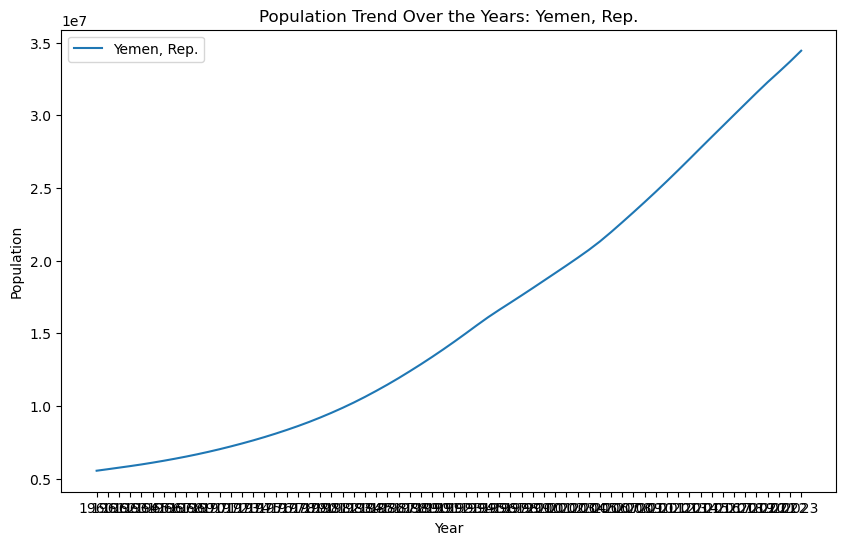

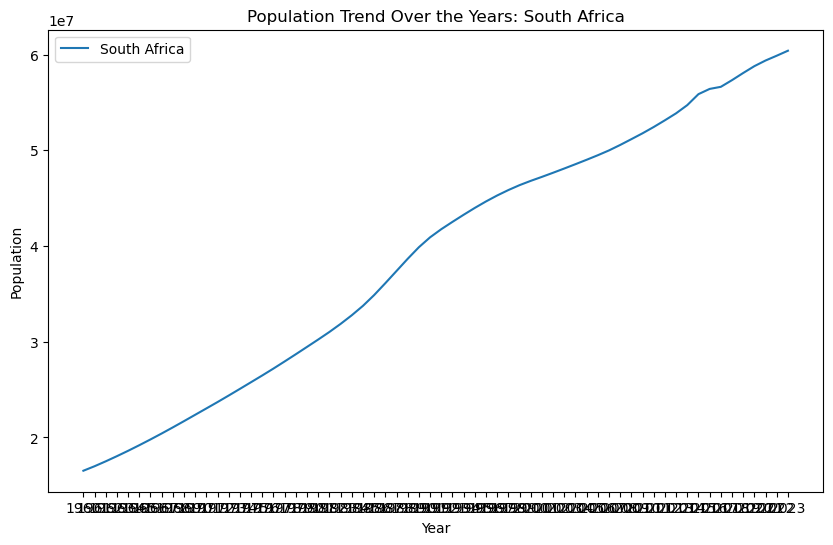

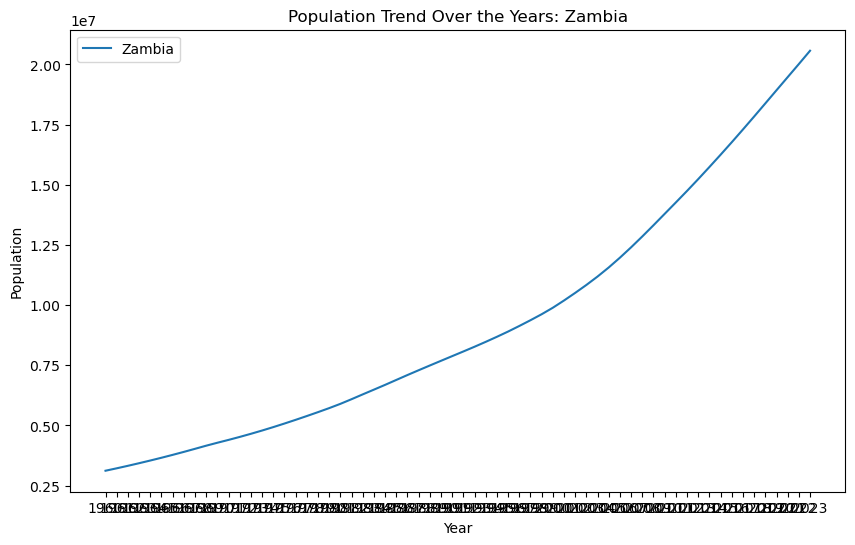

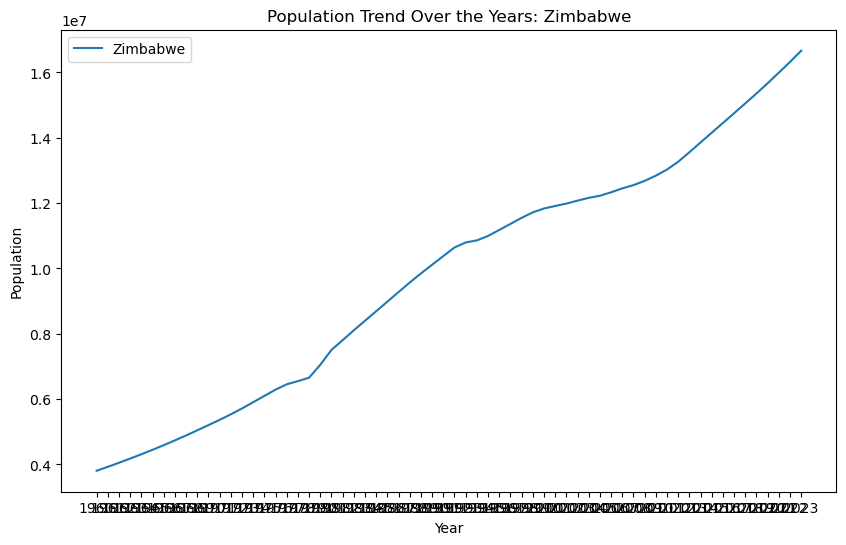

In [11]:
# Plotting population trends for all countries individually
for country in population_data.columns:
    plt.figure(figsize=(10, 6))
    plt.plot(population_data.index, population_data[country], label=country)
    plt.xlabel('Year')
    plt.ylabel('Population')
    plt.title(f'Population Trend Over the Years: {country}')
    plt.legend()
    plt.show()


In [20]:


# Filter the data for the year 2020
year_2020 = '2020'
population_2020 = merged_data[['Country Name', year_2020]].dropna()
population_2020[year_2020] = pd.to_numeric(population_2020[year_2020], errors='coerce')

# Filter the data for the year 2023
year_2023 = '2023'
population_2023 = merged_data[['Country Name', year_2023]].dropna()
population_2023[year_2023] = pd.to_numeric(population_2023[year_2023], errors='coerce')




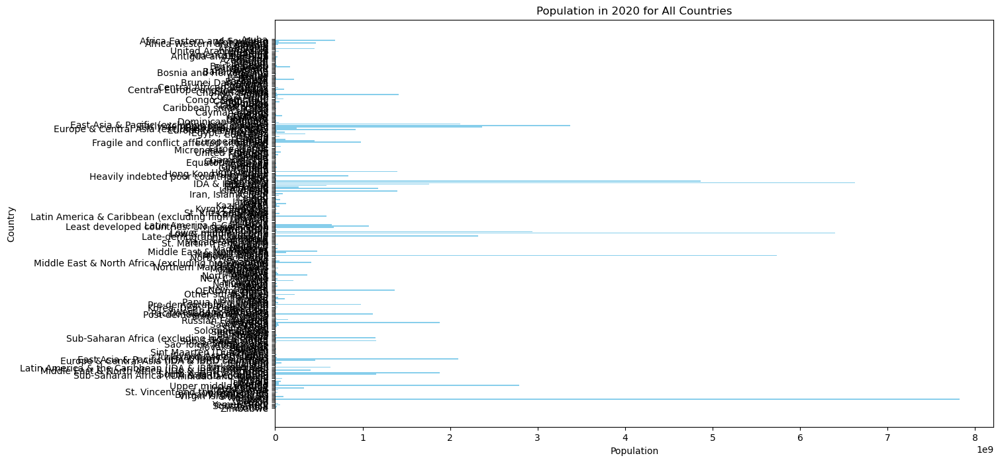

In [13]:
# 1. Bar plot for population in 2020 for all countries
plt.figure(figsize=(14, 8))
plt.barh(population_2020['Country Name'], population_2020[year_2020], color='skyblue')
plt.xlabel('Population')
plt.ylabel('Country')
plt.title('Population in 2020 for All Countries')
plt.gca().invert_yaxis()
plt.show()

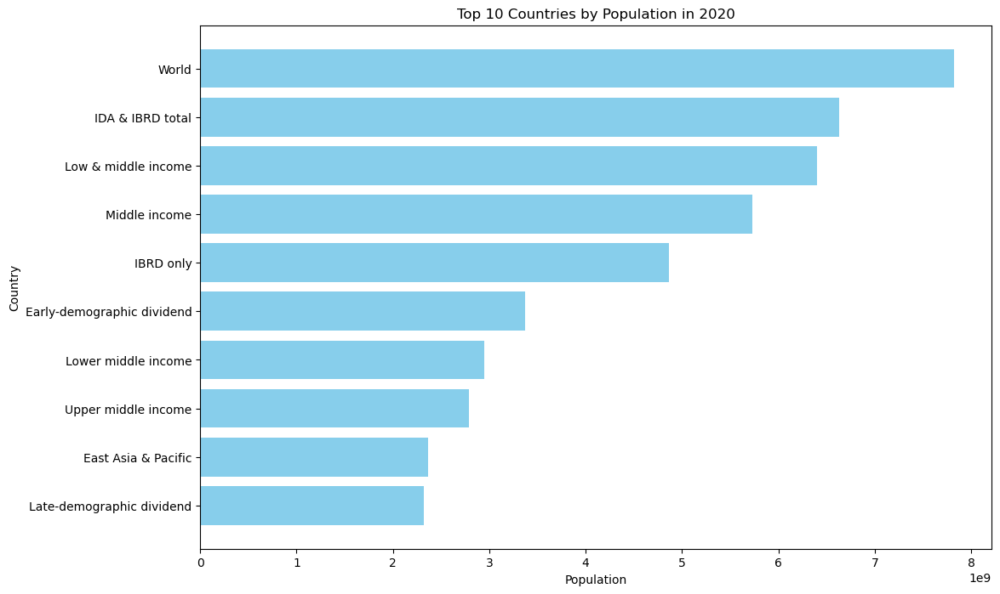

In [14]:
# 2. Bar plot for the top 10 countries by population in 2020
top_10_2020 = population_2020.sort_values(by=year_2020, ascending=False).head(10)
plt.figure(figsize=(12, 8))
plt.barh(top_10_2020['Country Name'], top_10_2020[year_2020], color='skyblue')
plt.xlabel('Population')
plt.ylabel('Country')
plt.title('Top 10 Countries by Population in 2020')
plt.gca().invert_yaxis()
plt.show()

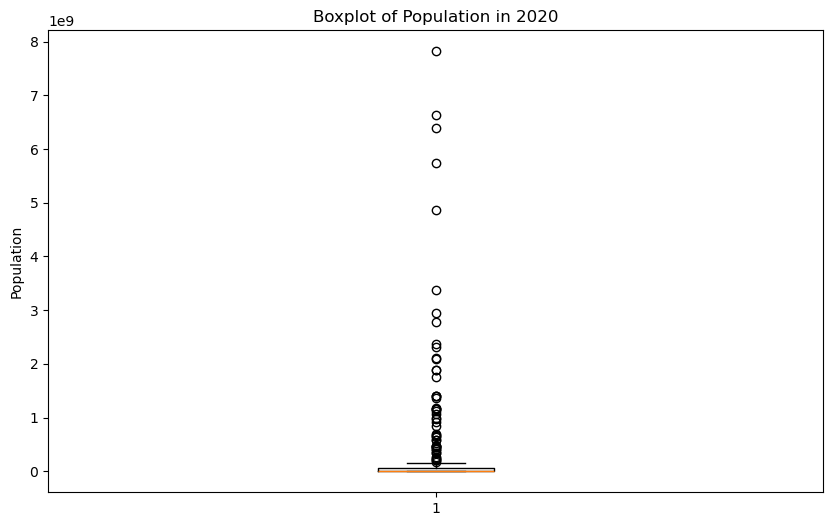

In [15]:
# 3. Boxplot of population in 2020
plt.figure(figsize=(10, 6))
plt.boxplot(population_2020[year_2020].dropna())
plt.ylabel('Population')
plt.title('Boxplot of Population in 2020')
plt.show()

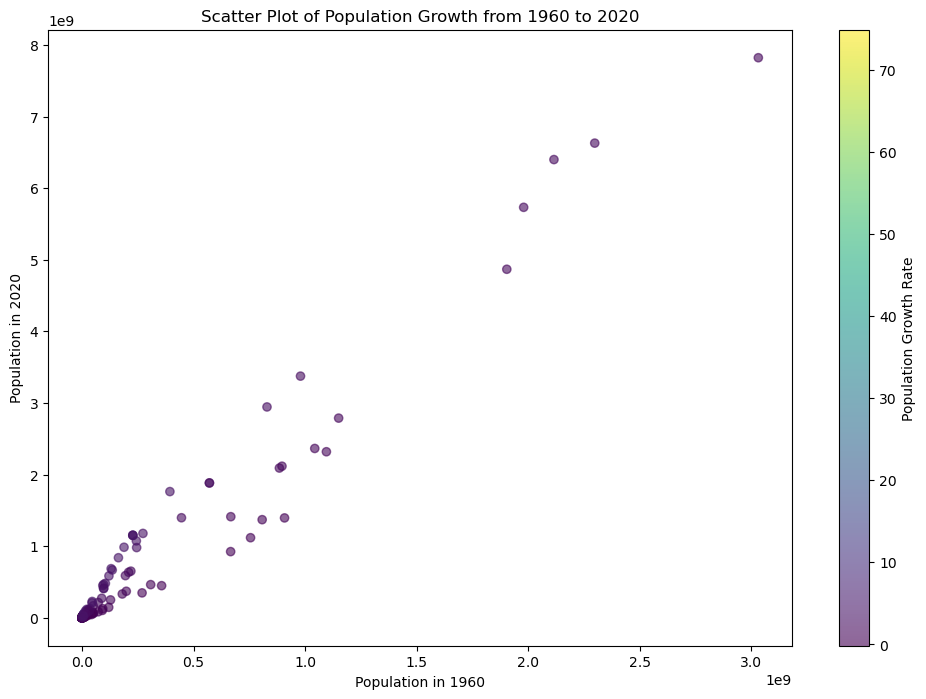

In [16]:
# 4. Scatter plot for population growth from 1960 to 2020
population_growth = merged_data[['Country Name', '1960', '2020']].dropna()
population_growth['1960'] = pd.to_numeric(population_growth['1960'], errors='coerce')
population_growth['2020'] = pd.to_numeric(population_growth['2020'], errors='coerce')
population_growth['Growth Rate'] = (population_growth['2020'] - population_growth['1960']) / population_growth['1960']

plt.figure(figsize=(12, 8))
plt.scatter(population_growth['1960'], population_growth['2020'], c=population_growth['Growth Rate'], cmap='viridis', alpha=0.6)
plt.colorbar(label='Population Growth Rate')
plt.xlabel('Population in 1960')
plt.ylabel('Population in 2020')
plt.title('Scatter Plot of Population Growth from 1960 to 2020')
plt.show()

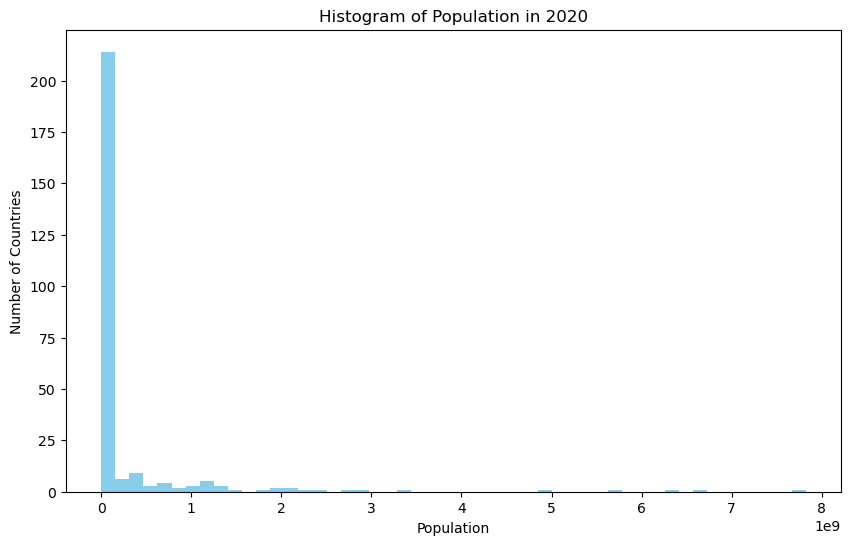

In [17]:
# 5. Histogram of population in 2020
plt.figure(figsize=(10, 6))
plt.hist(population_2020[year_2020].dropna(), bins=50, color='skyblue')
plt.xlabel('Population')
plt.ylabel('Number of Countries')
plt.title('Histogram of Population in 2020')
plt.show()

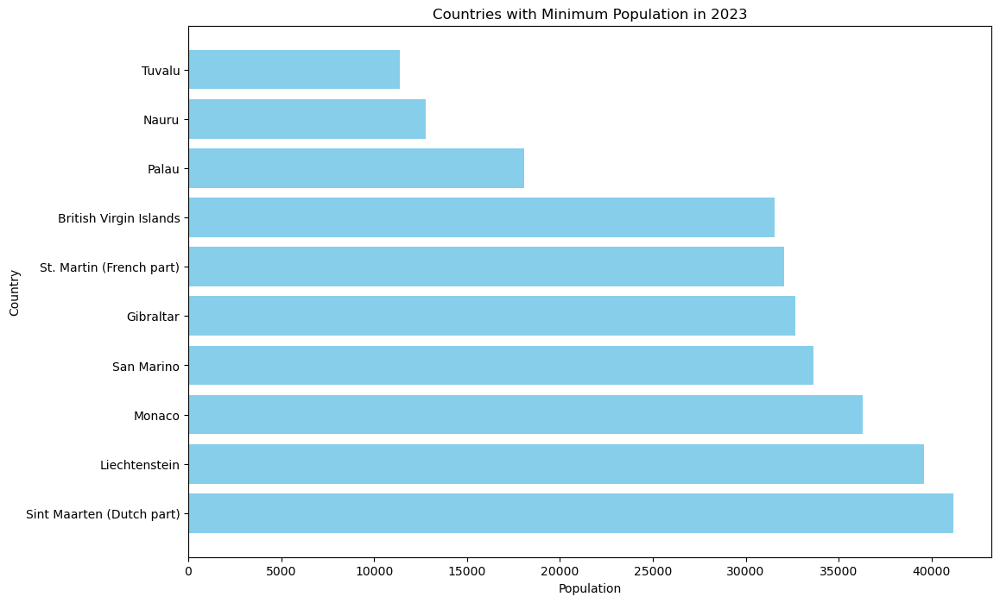

In [18]:
# 6. Bar plot for the countries with minimum population in 2023
bottom_10_2023 = population_2023.sort_values(by=year_2023).head(10)
plt.figure(figsize=(12, 8))
plt.barh(bottom_10_2023['Country Name'], bottom_10_2023[year_2023], color='skyblue')
plt.xlabel('Population')
plt.ylabel('Country')
plt.title('Countries with Minimum Population in 2023')
plt.gca().invert_yaxis()
plt.show()


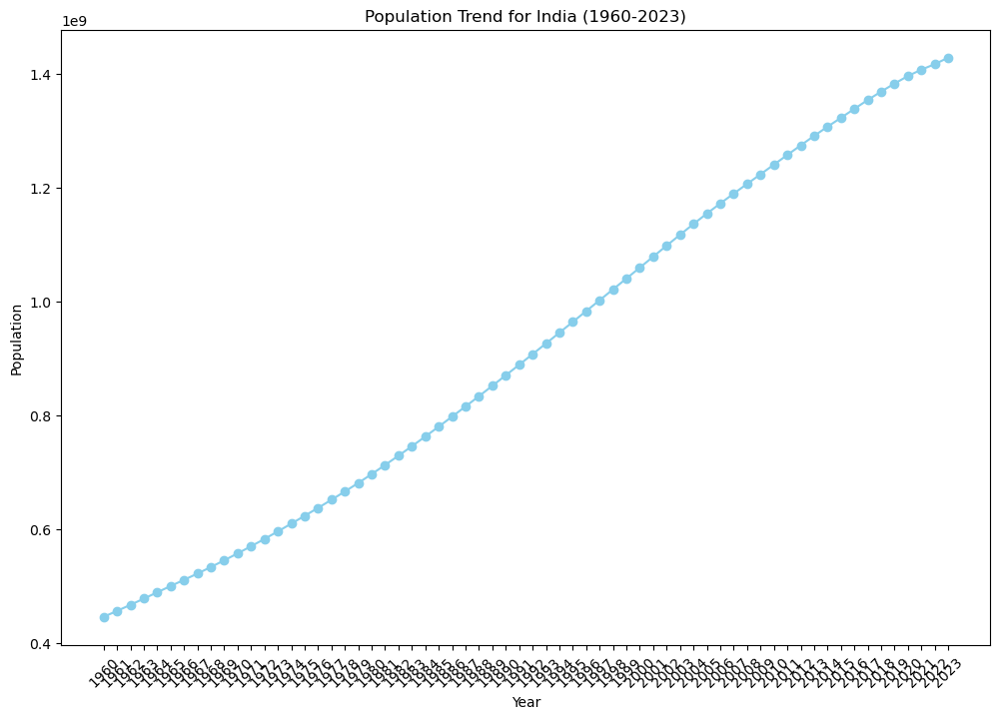

In [19]:
# 7. Plot time series for India
india_data = merged_data[merged_data['Country Name'] == 'India'].set_index('Country Name').T
india_population = india_data.loc['1960':'2023'].dropna().astype(float)

plt.figure(figsize=(12, 8))
plt.plot(india_population.index, india_population['India'], marker='o', linestyle='-', color='skyblue')
plt.xlabel('Year')
plt.ylabel('Population')
plt.title('Population Trend for India (1960-2023)')
plt.xticks(rotation=45)
plt.show()

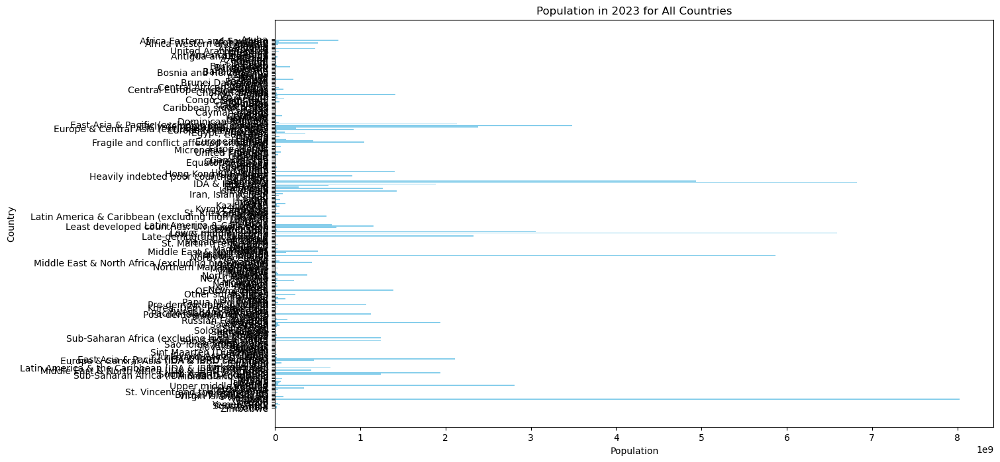

In [21]:
# 1. Bar plot for population in 2023 for all countries
plt.figure(figsize=(14, 8))
plt.barh(population_2023['Country Name'], population_2023[year_2023], color='skyblue')
plt.xlabel('Population')
plt.ylabel('Country')
plt.title('Population in 2023 for All Countries')
plt.gca().invert_yaxis()
plt.show()

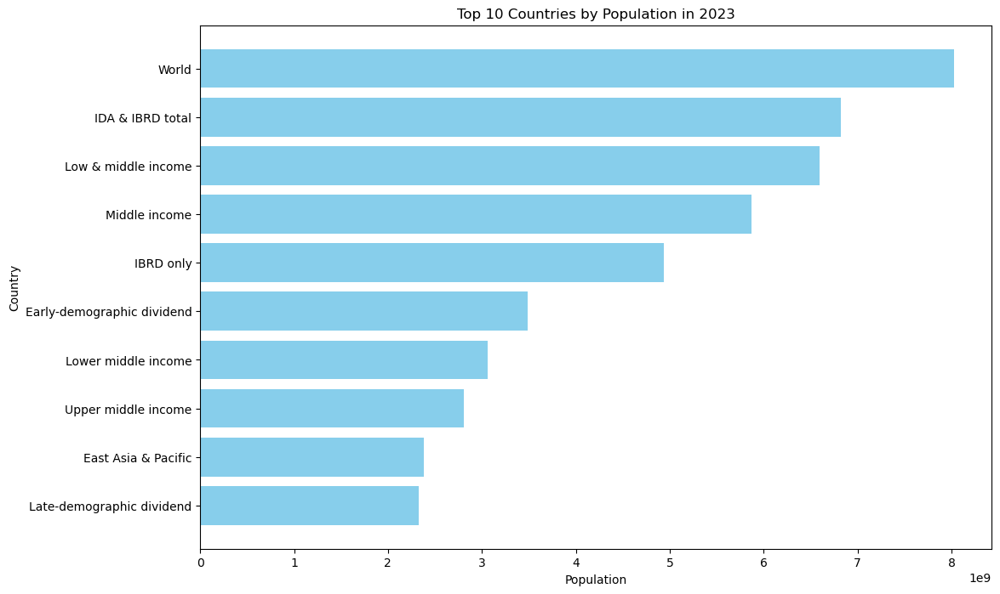

In [22]:
# 2. Bar plot for the top 10 countries by population in 2023
top_10_2023 = population_2023.sort_values(by=year_2023, ascending=False).head(10)
plt.figure(figsize=(12, 8))
plt.barh(top_10_2023['Country Name'], top_10_2023[year_2023], color='skyblue')
plt.xlabel('Population')
plt.ylabel('Country')
plt.title('Top 10 Countries by Population in 2023')
plt.gca().invert_yaxis()
plt.show()

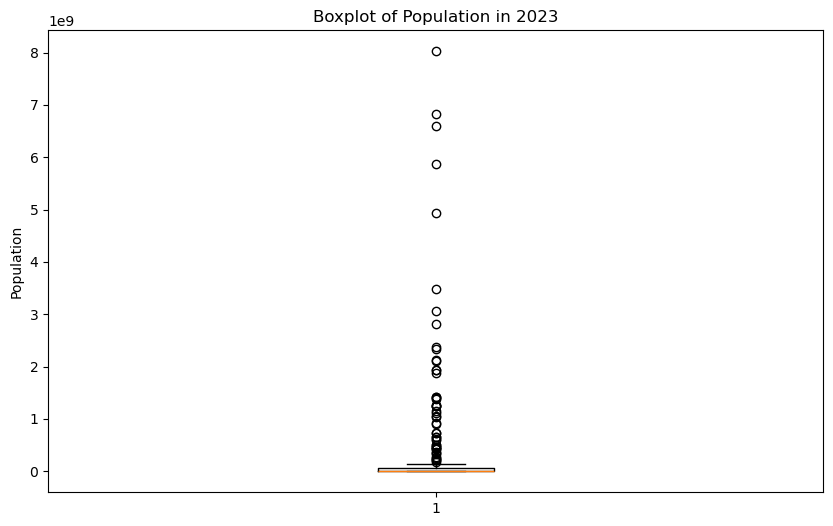

In [23]:
# 3. Boxplot of population in 2023
plt.figure(figsize=(10, 6))
plt.boxplot(population_2023[year_2023].dropna())
plt.ylabel('Population')
plt.title('Boxplot of Population in 2023')
plt.show()

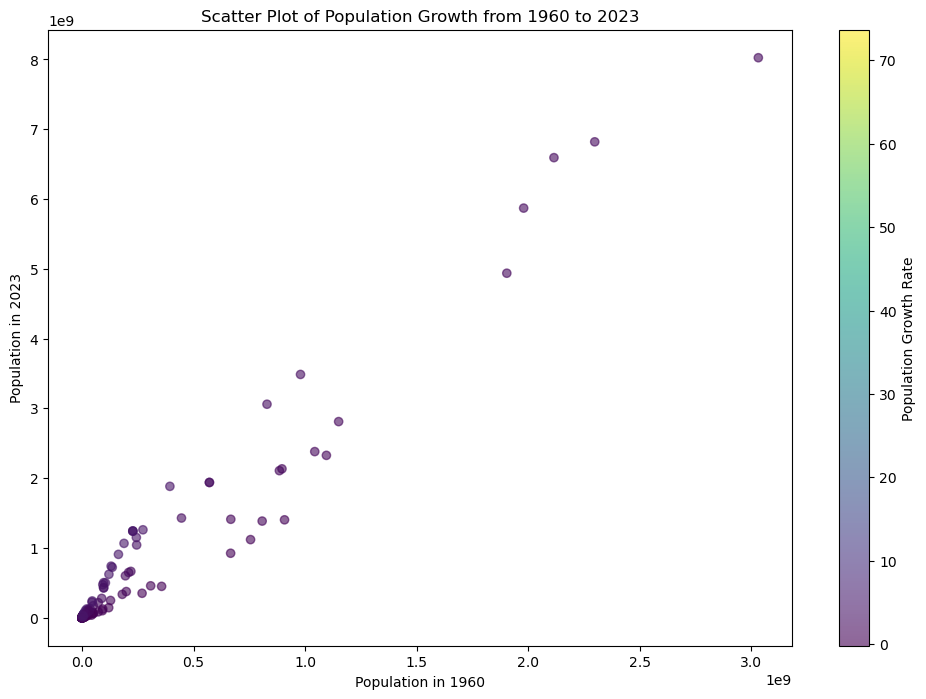

In [28]:
# 4. Scatter plot for population growth from 1960 to 2023
population_growth = merged_data[['Country Name', '1960', '2023']].dropna()
population_growth['1960'] = pd.to_numeric(population_growth['1960'], errors='coerce')
population_growth['2023'] = pd.to_numeric(population_growth['2023'], errors='coerce')
population_growth['Growth Rate'] = (population_growth['2023'] - population_growth['1960']) / population_growth['1960']
plt.figure(figsize=(12, 8))
plt.scatter(population_growth['1960'], population_growth['2023'], c=population_growth['Growth Rate'], cmap='viridis', alpha=0.6)
plt.colorbar(label='Population Growth Rate')
plt.xlabel('Population in 1960')
plt.ylabel('Population in 2023')
plt.title('Scatter Plot of Population Growth from 1960 to 2023')
plt.show()

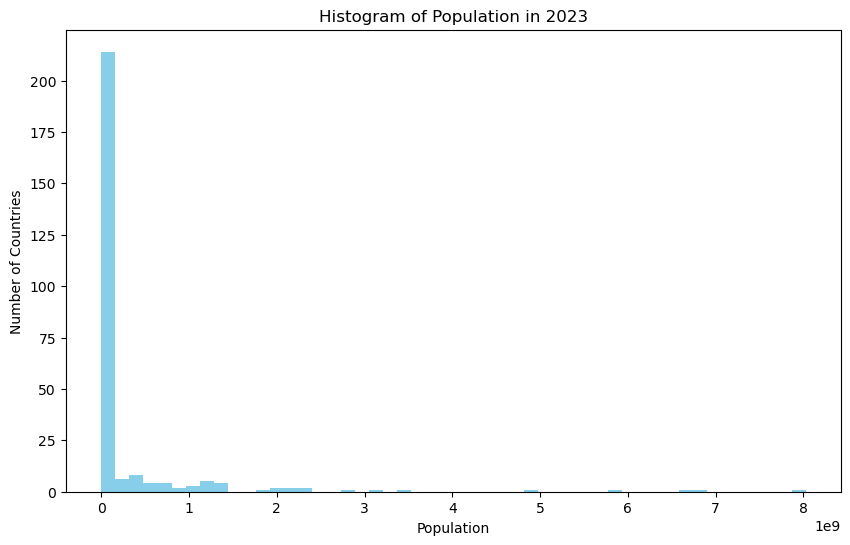

In [27]:
# 5. Histogram of population in 2023
plt.figure(figsize=(10, 6))
plt.hist(population_2023[year_2023].dropna(), bins=50, color='skyblue')
plt.xlabel('Population')
plt.ylabel('Number of Countries')
plt.title('Histogram of Population in 2023')
plt.show()